# PBS Analyses

In [1]:
# Import packages.
import allel
import numcodecs
import zarr
from functools import reduce
import gzip
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import re
import math

In [2]:
# Load the 1:1 ortholog data.
ortholog_df = pd.read_csv(
    '../annotations/orthogroup_mel_san_yak_mapping.txt',
    sep='\t', names=['orthogroup', 'mel', 'san', 'yak'],
)
# Create dictionaries for mapping gene names.
san_map_dicc = {key: val for key, val in zip(ortholog_df['san'].values, ortholog_df['mel'].values)}
yak_map_dicc = {key: val for key, val in zip(ortholog_df['yak'].values, ortholog_df['mel'].values)}

In [3]:
# Load the gene family data.
obp_df = pd.read_csv(
    '../annotations/obp_orthogroups.txt',
    sep='\t', names=['orthogroup', 'mel', 'san', 'yak'],
)
or_df = pd.read_csv(
    '../annotations/or_orthogroups.txt',
    sep='\t', names=['orthogroup', 'mel', 'san', 'yak'],
)
gr_df = pd.read_csv(
    '../annotations/gr_orthogroups.txt',
    sep='\t', names=['orthogroup', 'mel', 'san', 'yak'],
)
ir_df = pd.read_csv(
    '../annotations/ir_orthogroups.txt',
    sep='\t', names=['orthogroup', 'mel', 'san', 'yak'],
)
# Intalize a dictionary.
gene_family_dicc = {
    'san': {
        'obp': obp_df['san'].values, 'or': or_df['san'].values,
        'gr': gr_df['san'].values, 'ir': ir_df['san'].values,
    },
    'yak': {
        'obp': obp_df['yak'].values, 'or': or_df['yak'].values,
        'gr': gr_df['yak'].values, 'ir': ir_df['yak'].values,
    },
}

## SNP-level PBS

In [4]:
# Define a function to load the genome wide results.
def load_genome_pbs(prefix):
    # Intialize a dictionary.
    pbs_dicc = {
        'san:yak:tei': {},
        'san:yak-symp:yak-allo': {},
        'san:yak-symp:tei': {},
        'san:yak-allo:tei': {},
        'yak-symp:yak-allo:tei': {},
    }
    # For every chromosome.
    for chrom in ['2L', '2R', '3L', '3R', '4', 'X']:
        # Load the PBS resluts.
        pbs_dicc['san:yak:tei'][chrom] = np.loadtxt(
            f'./results/{prefix}/san_yak_tei_chr{chrom}_pbs.csv', delimiter=',',
        )
        pbs_dicc['san:yak-symp:yak-allo'][chrom] = np.loadtxt(
            f'./results/{prefix}/san_yak_symp_yak_allo_chr{chrom}_pbs.csv', delimiter=',',
        )
        pbs_dicc['san:yak-symp:tei'][chrom] = np.loadtxt(
            f'./results/{prefix}/san_yak_symp_tei_chr{chrom}_pbs.csv', delimiter=',',
        )
        pbs_dicc['san:yak-allo:tei'][chrom] = np.loadtxt(
            f'./results/{prefix}/san_yak_allo_tei_chr{chrom}_pbs.csv', delimiter=',',
        )
        pbs_dicc['yak-symp:yak-allo:tei'][chrom] = np.loadtxt(
            f'./results/{prefix}/yak_symp_yak_allo_tei_chr{chrom}_pbs.csv', delimiter=',',
        )
    return pbs_dicc

In [5]:
# Define a function to load and extract positions from a vcf file.
def load_pos(prefix):
    # Intialize a dictionary.
    pos_dicc = {}
    # For every chromosome.
    for chrom in ['2L', '2R', '3L', '3R', '4', 'X']:
        # Intialize a path.
        path = f'../zarrs/{prefix}/chr{chrom}.zarr'
        # Load the vcf file.
        callset = zarr.open_group(path, mode='r')
        # Extract the positions.
        pos_dicc[chrom] = allel.SortedIndex(callset[f'{chrom}/variants/POS'])
    return pos_dicc

In [6]:
def plot_genome_pbs(pbs_dicc, config, title, file_name):
    # Intialize figures and axes.
    plt.rcParams.update({'font.size': 8})
    fig = plt.figure(figsize=(6, 3), facecolor='white', constrained_layout=True, dpi=300)
    ax = fig.add_subplot(111)
    # Intialize the alternating colors.
    colors = ['tab:blue', 'tab:orange']
    # Intialize a list for label positions.
    x_labels_pos = []
    # Intialize a chromosome index tracker.
    idx = 0
    # Intialize a variable to store the genome length.
    genome_len = 0
    # Intialize a list store all pbs results.
    all_pbs = np.array([])
    # Intialize a list of chromosomes.
    chrom_list = ['2L', '2R', '3L', '3R', '4', 'X']
    # For every chromosome.
    for chrom in chrom_list:
        # Updated the total pbs array.
        all_pbs = np.append(all_pbs, pbs_dicc[config][chrom])
        # Determine the observed chromosome size.
        chrom_len = pbs_dicc[config][chrom].size
        # Update the observed genome length.
        genome_len += chrom_len
        # Determine the start, end, and mid point positions for the chromosomes.
        start_pos = genome_len - chrom_len
        end_pos = start_pos + chrom_len
        mid_pos = end_pos - ((end_pos - start_pos) / 2)
        # Convert negative and missing values to 0.
        pbs_no_neg = np.where((pbs_dicc[config][chrom] < 0) , 0, pbs_dicc[config][chrom])
        pbs = np.where(np.isnan(pbs_no_neg) , 0, pbs_no_neg)
        # Plot the pbs values.
        ax.plot(
            np.arange(start_pos, end_pos), pbs,
            ls='', marker='o', ms=3, color=colors[abs(idx)], alpha=0.25,
        )
        # Update the index.
        idx = abs(idx - 1)
        # Record the midpoint for labeling.
        x_labels_pos.append(mid_pos)
    # Plot the signicance threshold.
    ax.axhline(
        np.nanpercentile(all_pbs, 99), 0, 1,
        color='black', ls='dashed', lw=1,
    )
    # Plot the x-axis.
    ax.set_xticks(x_labels_pos)
    ax.set_xticklabels(chrom_list)
    ax.set_xlabel('Chromosome')
    # Plot the y-axis.
    ax.set_ylim((0, 1))
    ax.set_ylabel(r'$PBS_{n1}$')
    # Despine the axes.
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    # Plot the title.
    ax.set_title(title)
    # Show the plot.
    plt.savefig(
        f'./figures/{file_name}.png', format='png',
        facecolor='white', bbox_inches='tight', dpi=300,
    )
    plt.show()
    return

In [7]:
# Load the PBS results.
san_genome_dicc = load_genome_pbs('san')
yak_genome_dicc = load_genome_pbs('yak')

In [8]:
# For every configuration.
for key in san_genome_dicc.keys():
    # Intialize an empty array.
    san_genome_dicc[key]['all'] = np.array([])
    # For every chromosome.
    for chrom in san_genome_dicc[key].keys():
        # Update the array.
        san_genome_dicc[key]['all'] = np.append(san_genome_dicc[key]['all'], san_genome_dicc[key][chrom])

In [9]:
# For every configuration.
for key in yak_genome_dicc.keys():
    # Intialize an empty array.
    yak_genome_dicc[key]['all'] = np.array([])
    # For every chromosome.
    for chrom in yak_genome_dicc[key].keys():
        # Update the array.
        yak_genome_dicc[key]['all'] = np.append(yak_genome_dicc[key]['all'], yak_genome_dicc[key][chrom])

In [10]:
# Load the observed positions.
san_pos_dicc = load_pos('san')
yak_pos_dicc = load_pos('yak')

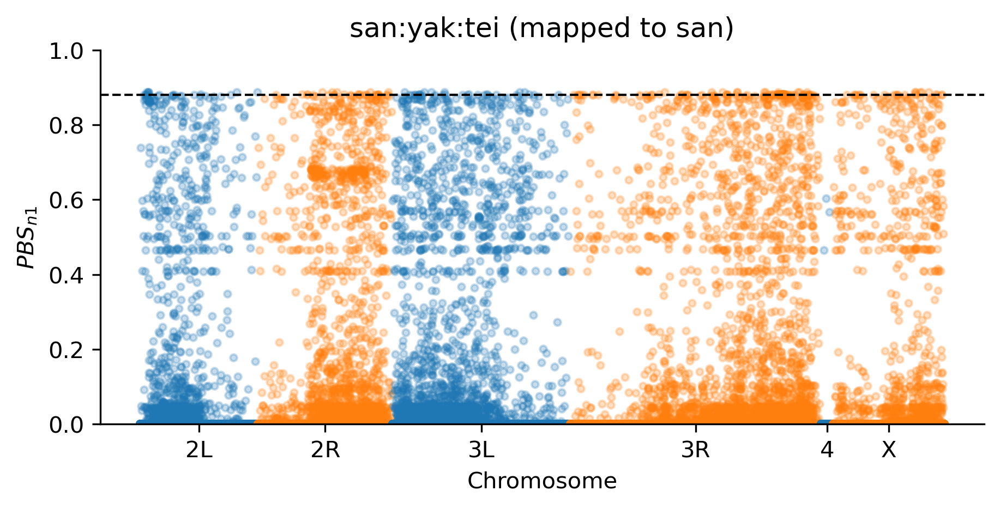

In [11]:
plot_genome_pbs(
    san_genome_dicc, 'san:yak:tei',
    'san:yak:tei (mapped to san)',
    'san_yak_tei_map_san_pbs',
)

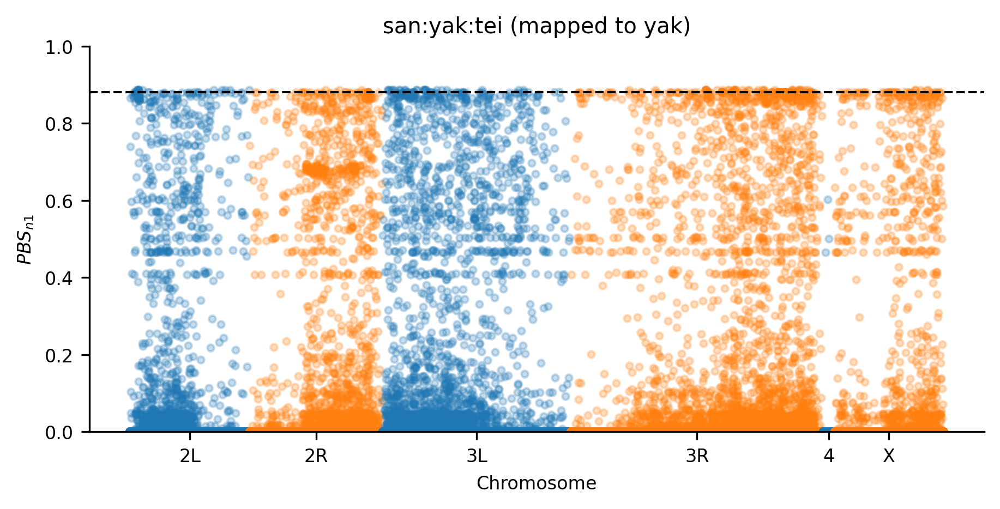

In [12]:
plot_genome_pbs(
    yak_genome_dicc, 'san:yak:tei',
    'san:yak:tei (mapped to yak)',
    'san_yak_tei_map_yak_pbs',
)

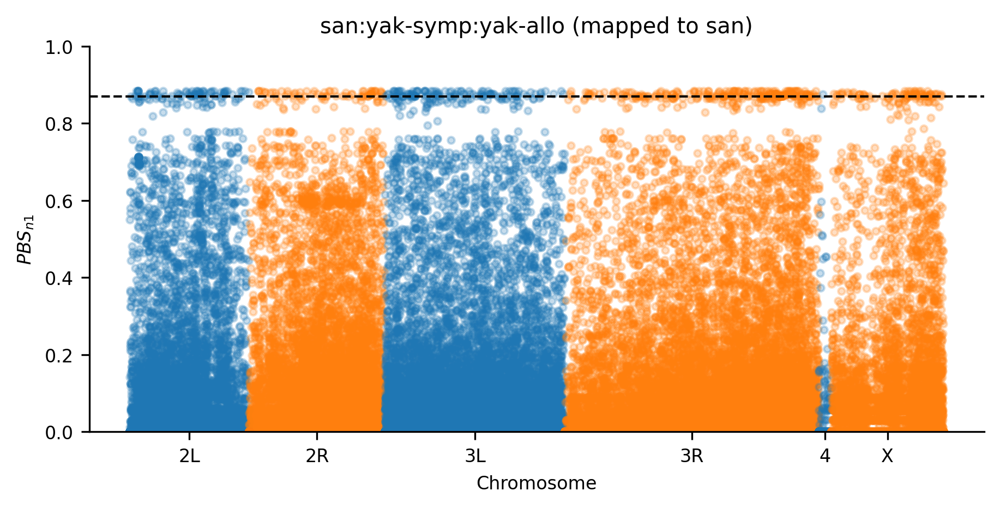

In [13]:
plot_genome_pbs(
    san_genome_dicc, 'san:yak-symp:yak-allo',
    'san:yak-symp:yak-allo (mapped to san)',
    'san_yak_symp_yak_allo_map_san_pbs',
)

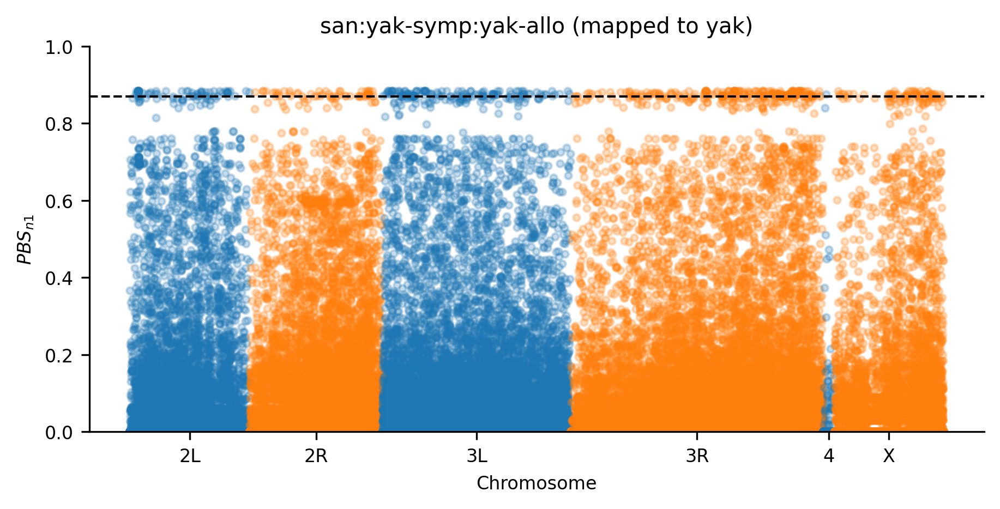

In [14]:
plot_genome_pbs(
    yak_genome_dicc, 'san:yak-symp:yak-allo',
    'san:yak-symp:yak-allo (mapped to yak)',
    'san_yak_symp_yak_allo_map_yak_pbs',
)

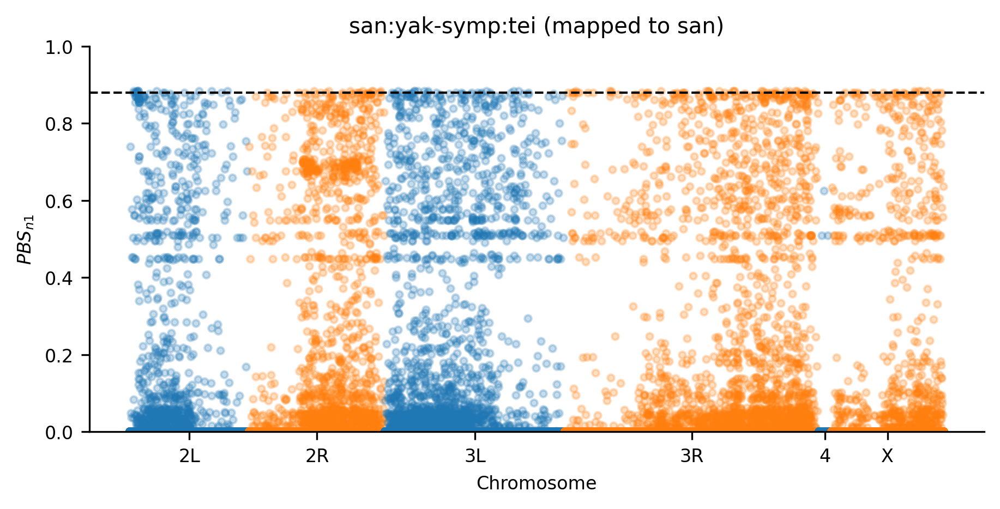

In [15]:
plot_genome_pbs(
    san_genome_dicc, 'san:yak-symp:tei',
    'san:yak-symp:tei (mapped to san)',
    'san_yak_symp_tei_map_san_pbs',
)

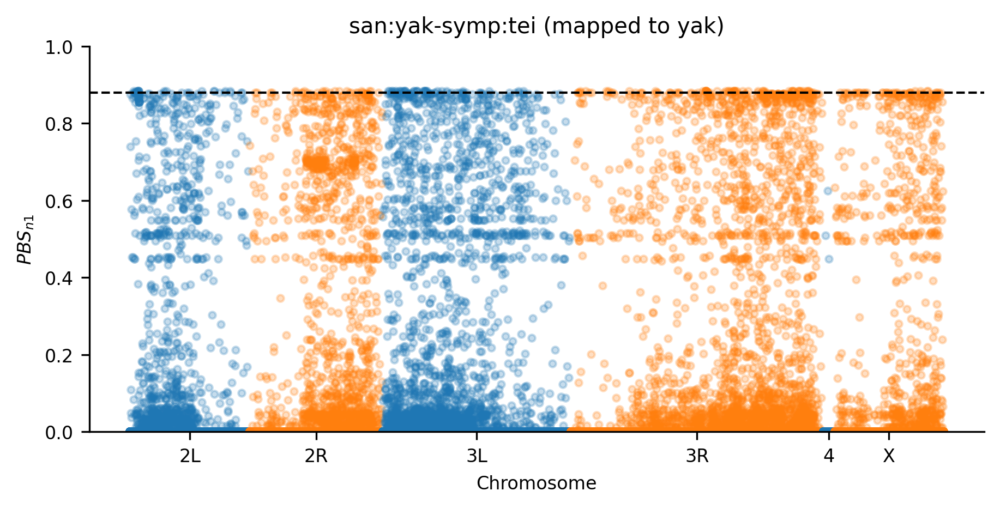

In [16]:
plot_genome_pbs(
    yak_genome_dicc, 'san:yak-symp:tei',
    'san:yak-symp:tei (mapped to yak)',
    'san_yak_symp_tei_map_yak_pbs',
)

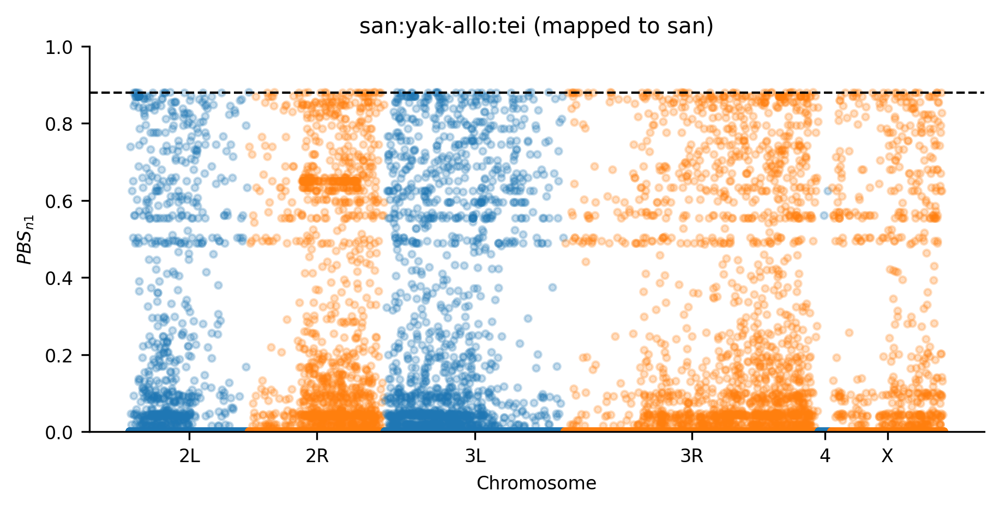

In [17]:
plot_genome_pbs(
    san_genome_dicc, 'san:yak-allo:tei',
    'san:yak-allo:tei (mapped to san)',
    'san_yak_allo_tei_map_san_pbs',
)

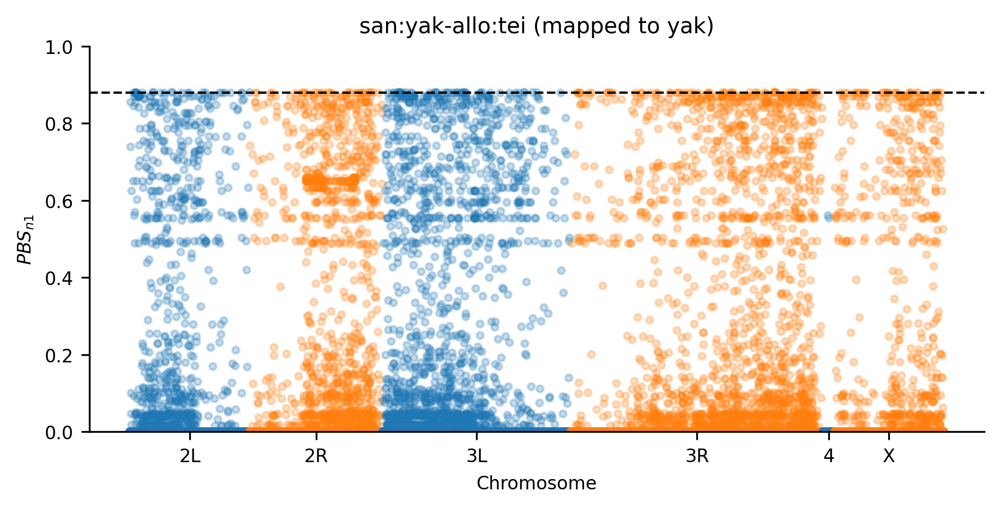

In [18]:
plot_genome_pbs(
    yak_genome_dicc, 'san:yak-allo:tei',
    'san:yak-allo:tei (mapped to yak)',
    'san_yak_allo_tei_map_yak_pbs',
)

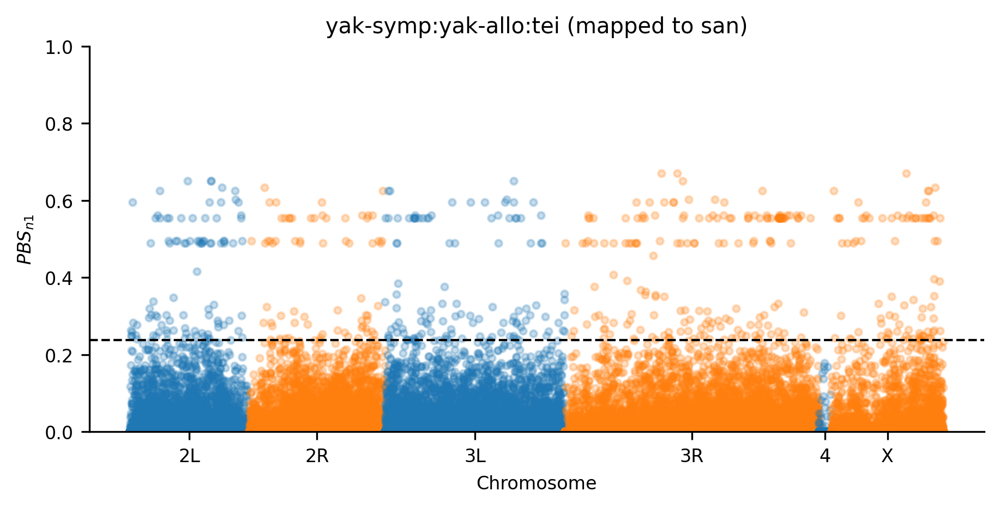

In [19]:
plot_genome_pbs(
    san_genome_dicc, 'yak-symp:yak-allo:tei',
    'yak-symp:yak-allo:tei (mapped to san)',
    'yak_symp_yak_allo_tei_map_san_pbs',
)

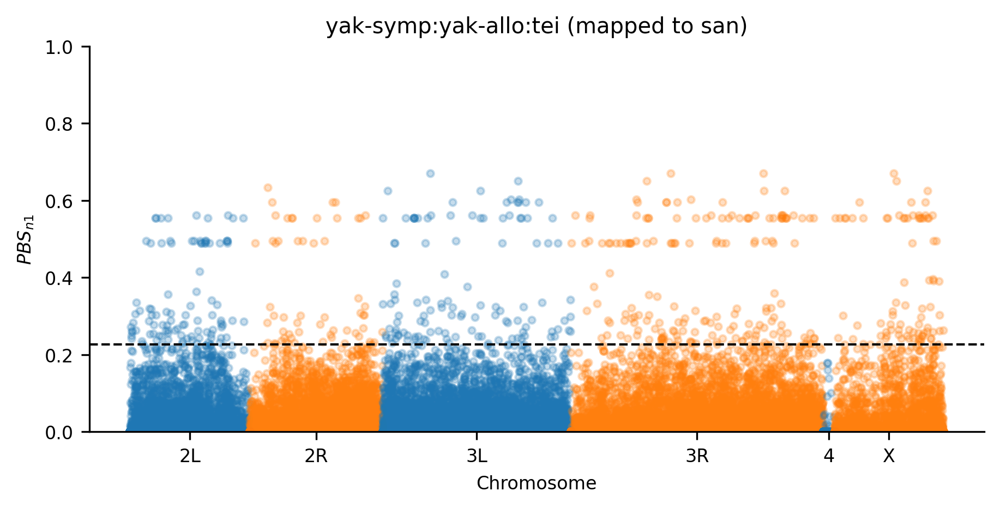

In [20]:
plot_genome_pbs(
    yak_genome_dicc, 'yak-symp:yak-allo:tei',
    'yak-symp:yak-allo:tei (mapped to san)',
    'yak_symp_yak_allo_tei_map_yak_pbs',
)

## Ortholog-level PBS

In [21]:
# Define a function to load the bootstrapped PBS values.
def load_bootstraps(prefix):
    # Load the bootstrapped matrix.
    bs_mat = np.loadtxt(f'./results/{prefix}/bootstrap_pbs.csv', delimiter=',', dtype=object)
    # Intialize a dictionary.
    pbs_dicc = {
        'san:yak:tei': bs_mat[:, 3].astype(float),
        'san:yak-symp:yak-allo': bs_mat[:, 4].astype(float),
        'san:yak-symp:tei': bs_mat[:, 5].astype(float),
        'san:yak-allo:tei': bs_mat[:, 6].astype(float),
        'yak-symp:yak-allo:tei': bs_mat[:, 7].astype(float),
    }
    return pbs_dicc

In [22]:
# Define a function to load the per gene estimates.
def load_ortholog_pbs(prefix):
    # Load the results matrix.
    ortho_mat = np.loadtxt(f'./results/{prefix}/ortholog_pbs.csv', delimiter=',')
    # Intialize a dictionary.
    pbs_dicc = {
        'san:yak:tei': {'pbs': ortho_mat[:, 0]},
        'san:yak-symp:yak-allo': {'pbs': ortho_mat[:, 1]},
        'san:yak-symp:tei': {'pbs': ortho_mat[:, 2]},
        'san:yak-allo:tei': {'pbs': ortho_mat[:, 3]},
        'yak-symp:yak-allo:tei': {'pbs': ortho_mat[:, 4]},
    }
    # For every configuration.
    for key in pbs_dicc.keys():
        # Intialize a list for p-values.
        pval_list = []
        # For every ortholog.
        for idx in range(pbs_dicc[key]['pbs'].size):
            # Calculate the p-value.
            pval = (np.count_nonzero(pbs_dicc[key]['pbs'][idx] <= pbs_dicc[key]['pbs'])
                     / (np.sum(~np.isnan(pbs_dicc[key]['pbs'])) + 1))
            # Append the list.
            pval_list.append(pval)
        # Update the dictionary.
        pbs_dicc[key]['pval'] = np.array(pval_list)
    return pbs_dicc

In [23]:
# Define a function to load the per gene estimates.
def load_bootstraps_pbs(prefix):
    # Load the results matrix.
    ortho_mat = np.loadtxt(f'./results/{prefix}/ortholog_pbs.csv', delimiter=',')
    # Intialize a dictionary.
    pbs_dicc = {
        'san:yak:tei': {'pbs': ortho_mat[:, 0]},
        'san:yak-symp:yak-allo': {'pbs': ortho_mat[:, 1]},
        'san:yak-symp:tei': {'pbs': ortho_mat[:, 2]},
        'san:yak-allo:tei': {'pbs': ortho_mat[:, 3]},
        'yak-symp:yak-allo:tei': {'pbs': ortho_mat[:, 4]},
    }
    # Load the bootstrapped results.
    bs_dicc = load_bootstraps(prefix)
    # For every configuration.
    for key in pbs_dicc.keys():
        # Intialize a list for p-values.
        pval_list = []
        # For every ortholog.
        for idx in range(pbs_dicc[key]['pbs'].size):
            # Calculate the p-value.
            pval = (np.count_nonzero(pbs_dicc[key]['pbs'][idx] <= bs_dicc[key])
                     / (np.sum(~np.isnan(bs_dicc[key])) + 1))
            # Append the list.
            pval_list.append(pval)
        # Update the dictionary.
        pbs_dicc[key]['pval'] = np.array(pval_list)
    return pbs_dicc

In [24]:
# Load the ortholog results.
san_ortho_dicc = load_ortholog_pbs('san')
yak_ortho_dicc = load_ortholog_pbs('yak')

In [25]:
# Load the bootstrap results.
san_bs_dicc = load_bootstraps_pbs('san')
yak_bs_dicc = load_bootstraps_pbs('yak')

In [26]:
# Define the configuration list.
config_list = [
    'san:yak:tei', 'san:yak-symp:yak-allo',
    'san:yak-symp:tei', 'san:yak-allo:tei',
    'yak-symp:yak-allo:tei',
]

In [27]:
# Load the ortholog data frame.
san_ortho_df = pd.read_csv(
    '../annotations/san_ortholog_qc_passed_coords.txt', sep='\t', usecols=[0, 1, 2, 3],
    names=['gene_id', 'chr', 'start', 'end'],
)
# Map the gene names and types.
san_ortho_df['gene'] = san_ortho_df['gene_id'].map(san_map_dicc)
# For every configuration.
for config in config_list:
    # Append the dataframes.
    san_ortho_df[config+'_pbs'] = san_ortho_dicc[config]['pbs']
    san_ortho_df[config+'_pval_ortho'] = san_ortho_dicc[config]['pval']
    san_ortho_df[config+'_pval_bs'] = san_bs_dicc[config]['pval']

In [28]:
# Load the ortholog data frame.
yak_ortho_df = pd.read_csv(
    '../annotations/yak_ortholog_qc_passed_coords.txt', sep='\t', usecols=[0, 1, 2, 3],
    names=['gene_id', 'chr', 'start', 'end'],
)
# Map the gene names.
yak_ortho_df['gene'] = yak_ortho_df['gene_id'].map(yak_map_dicc)
# For every configuration.
for config in config_list:
    # Append the dataframes.
    yak_ortho_df[config+'_pbs'] = yak_ortho_dicc[config]['pbs']
    yak_ortho_df[config+'_pval_ortho'] = yak_ortho_dicc[config]['pval']
    yak_ortho_df[config+'_pval_bs'] = yak_bs_dicc[config]['pval']

In [29]:
# Extract the gene ids.
san_gene_ids = san_ortho_df['gene_id'].values
# Create gene family masks.
san_obp_mask = np.isin(san_gene_ids, gene_family_dicc['san']['obp'])
san_or_mask = np.isin(san_gene_ids, gene_family_dicc['san']['or'])
san_gr_mask = np.isin(san_gene_ids, gene_family_dicc['san']['gr'])
san_ir_mask = np.isin(san_gene_ids, gene_family_dicc['san']['ir'])
# Compile gene family dataframes.
san_obp_df = san_ortho_df[san_obp_mask]
san_or_df = san_ortho_df[san_or_mask]
san_gr_df = san_ortho_df[san_gr_mask]
san_ir_df = san_ortho_df[san_ir_mask]
# Concatenate the dataframe.
san_olfac_gene_df = pd.concat(
    [san_obp_df, san_or_df, san_gr_df, san_ir_df],
    axis=0, ignore_index=True,
)

In [30]:
# Extract the gene ids.
yak_gene_ids = yak_ortho_df['gene_id'].values
# Create gene family masks.
yak_obp_mask = np.isin(yak_gene_ids, gene_family_dicc['yak']['obp'])
yak_or_mask = np.isin(yak_gene_ids, gene_family_dicc['yak']['or'])
yak_gr_mask = np.isin(yak_gene_ids, gene_family_dicc['yak']['gr'])
yak_ir_mask = np.isin(yak_gene_ids, gene_family_dicc['yak']['ir'])
# Compile gene family dataframes.
yak_obp_df = yak_ortho_df[yak_obp_mask]
yak_or_df = yak_ortho_df[yak_or_mask]
yak_gr_df = yak_ortho_df[yak_gr_mask]
yak_ir_df = yak_ortho_df[yak_ir_mask]
# Concatenate the dataframe.
yak_olfac_gene_df = pd.concat(
    [yak_obp_df, yak_or_df, yak_gr_df, yak_ir_df],
    axis=0, ignore_index=True,
)

In [31]:
# # Export the dataframes.
# san_ortho_df.to_csv('./tables/san_all_orthologs_pbs.txt', sep='\t', header=True, index=False)
# san_olfac_gene_df.to_csv('./tables/san_olfactory_orthologs_pbs.txt', sep='\t', header=True, index=False)
# yak_ortho_df.to_csv('./tables/yak_all_orthologs_pbs.txt', sep='\t', header=True, index=False)
# yak_olfac_gene_df.to_csv('./tables/yak_olfactory_orthologs_pbs.txt', sep='\t', header=True, index=False)

In [32]:
san_ortho_df

,gene_id,chr,start,end,gene,san:yak:tei_pbs,san:yak:tei_pval_ortho,san:yak:tei_pval_bs,san:yak-symp:yak-allo_pbs,san:yak-symp:yak-allo_pval_ortho,san:yak-symp:yak-allo_pval_bs,san:yak-symp:tei_pbs,san:yak-symp:tei_pval_ortho,san:yak-symp:tei_pval_bs,san:yak-allo:tei_pbs,san:yak-allo:tei_pval_ortho,san:yak-allo:tei_pval_bs,yak-symp:yak-allo:tei_pbs,yak-symp:yak-allo:tei_pval_ortho,yak-symp:yak-allo:tei_pval_bs
0,LOC120444045,2L,20381,32419,l_2_gl,NaN,0.000000,0.000000,0.267787,0.119005,0.124052,NaN,0.000000,0.000000,NaN,0.000000,0.000000,-0.055533,0.928902,0.922909
1,LOC120445319,2L,36263,67161,Cda5,0.739456,0.050252,0.058414,0.276007,0.108948,0.116223,0.739456,0.052108,0.061743,0.739456,0.064980,0.070264,-0.038093,0.865775,0.833028
2,LOC120454547,2L,73205,78205,dbr,NaN,0.000000,0.000000,0.208650,0.222022,0.208675,NaN,0.000000,0.000000,NaN,0.000000,0.000000,-0.077177,0.953844,0.951379
3,LOC120454459,2L,78882,83883,galectin,NaN,0.000000,0.000000,0.116216,0.566787,0.488619,NaN,0.000000,0.000000,NaN,0.000000,0.000000,-0.025492,0.779378,0.743733
4,LOC120454483,2L,81941,86942,CG11374,0.048126,0.585997,0.532527,0.166051,0.351470,0.306501,0.048288,0.580973,0.530240,0.047050,0.581341,0.529962,-0.048530,0.911417,0.899535
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9314,LOC120455136,X,22413773,22418774,CG17169,NaN,0.000000,0.000000,0.469065,0.022305,0.031705,NaN,0.000000,0.000000,NaN,0.000000,0.000000,0.232960,0.004243,0.004618
9315,LOC120455135,X,22414401,22419402,CG17162,NaN,0.000000,0.000000,0.469065,0.022305,0.031705,NaN,0.000000,0.000000,NaN,0.000000,0.000000,0.232960,0.004243,0.004618
9316,LOC120455134,X,22419095,22424096,CG17159,NaN,0.000000,0.000000,NaN,0.000000,0.000000,NaN,0.000000,0.000000,NaN,0.000000,0.000000,NaN,0.000000,0.000000
9317,LOC120455492,X,22429619,22434620,su_f_,NaN,0.000000,0.000000,0.644762,0.008896,0.010885,NaN,0.000000,0.000000,NaN,0.000000,0.000000,0.115388,0.019414,0.023853


In [33]:
san_olfac_gene_df

,gene_id,chr,start,end,gene,san:yak:tei_pbs,san:yak:tei_pval_ortho,san:yak:tei_pval_bs,san:yak-symp:yak-allo_pbs,san:yak-symp:yak-allo_pval_ortho,san:yak-symp:yak-allo_pval_bs,san:yak-symp:tei_pbs,san:yak-symp:tei_pval_ortho,san:yak-symp:tei_pval_bs,san:yak-allo:tei_pbs,san:yak-allo:tei_pval_ortho,san:yak-allo:tei_pval_bs,yak-symp:yak-allo:tei_pbs,yak-symp:yak-allo:tei_pval_ortho,yak-symp:yak-allo:tei_pval_bs
0,LOC120458484,2L,1997032,2002033,Obp22a,0.078200,0.523549,0.474049,0.138483,0.464930,0.400593,0.080340,0.515892,0.470792,0.149206,0.429566,0.395296,-0.015041,0.662895,0.628216
1,LOC120457390,2L,16881700,16886701,Obp44a,NaN,0.000000,0.000000,0.377506,0.045384,0.058443,NaN,0.000000,0.000000,NaN,0.000000,0.000000,0.026013,0.159038,0.169220
2,LOC120458636,2L,19065399,19070399,Obp46a,NaN,0.000000,0.000000,0.161155,0.369649,0.322925,NaN,0.000000,0.000000,NaN,0.000000,0.000000,-0.009735,0.590255,0.564873
3,LOC120446351,2R,3851009,3856010,Obp47a,NaN,0.000000,0.000000,NaN,0.000000,0.000000,NaN,0.000000,0.000000,NaN,0.000000,0.000000,NaN,0.000000,0.000000
4,LOC120446103,2R,12267867,12272868,Obp57d,0.287148,0.282801,0.281581,0.131207,0.501031,0.431154,0.292367,0.281946,0.279774,0.271269,0.318867,0.314220,-0.017218,0.688995,0.652069
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87,LOC120453912,3R,8631216,8636217,Ir85a,NaN,0.000000,0.000000,NaN,0.000000,0.000000,NaN,0.000000,0.000000,NaN,0.000000,0.000000,NaN,0.000000,0.000000
88,LOC120451139,3R,13567831,13572832,Ir87a,NaN,0.000000,0.000000,NaN,0.000000,0.000000,NaN,0.000000,0.000000,NaN,0.000000,0.000000,NaN,0.000000,0.000000
89,LOC120452366,3R,28609231,28614232,Ir100a,0.243595,0.326325,0.316385,0.233706,0.168901,0.167801,0.273304,0.296649,0.293979,NaN,0.000000,0.000000,-0.125723,0.976086,0.971844
90,LOC120456196,X,13869640,13874641,Ir7g,NaN,0.000000,0.000000,0.055138,0.857530,0.809587,NaN,0.000000,0.000000,NaN,0.000000,0.000000,-0.033479,0.839162,0.804813


In [34]:
# Define a list of ortho columns.
ortho_cols = ['gene_id', 'chr', 'start', 'end', 'gene']
# Define an olfactory gene famaly list.
olfactory_gene_list = ['obp', 'or', 'gr', 'ir']
# Define a significance list.
sig_list = ['ortho', 'bs']

In [35]:
# Intialize an outlier dictionary.
san_outlier_dicc = {}
# For every configuration.
for config in config_list:
    # Intialize the subdictionary.
    san_outlier_dicc[config] = {}
    # For every significance type...
    for sig in sig_list:
        # Intialize the subdictionary.
        san_outlier_dicc[config][sig] = {}
        # Subset the data frame.
        subset_df = san_olfac_gene_df[ortho_cols+[config+'_pbs', config+f'_pval_{sig}']].dropna()
        # Determine the significance threshold.
        threshold = 0.05
        # Extract the outlier dataframe.
        outlier_df = subset_df[subset_df[config+f'_pval_{sig}'].values < threshold]
        # Fill the dictionary.
        san_outlier_dicc[config][sig]['df'] = outlier_df
        san_outlier_dicc[config][sig]['genes'] = outlier_df['gene'].values

In [36]:
# Intialize an outlier dictionary.
yak_outlier_dicc = {}
# For every configuration.
for config in config_list:
    # Intialize the subdictionary.
    yak_outlier_dicc[config] = {}
    # For every significance type...
    for sig in sig_list:
        # Intialize the subdictionary.
        yak_outlier_dicc[config][sig] = {}
        # Subset the data frame.
        subset_df = yak_olfac_gene_df[ortho_cols+[config+'_pbs', config+f'_pval_{sig}']].dropna()
        # Determine the significance threshold.
        threshold = 0.05
        # Extract the outlier dataframe.
        outlier_df = subset_df[subset_df[config+f'_pval_{sig}'].values < threshold]
        # Fill the dictionary.
        yak_outlier_dicc[config][sig]['df'] = outlier_df
        yak_outlier_dicc[config][sig]['genes'] = outlier_df['gene'].values

In [37]:
# For every configuration.
for config in config_list:
    # For every significance type...
    for sig in sig_list:
        print(config, sig)
        print('san', san_outlier_dicc[config][sig]['genes'])
        print('yak', yak_outlier_dicc[config][sig]['genes'])

san:yak:tei ortho
san ['Or24a' 'Or43b' 'Gr59e' 'Gr59f']
yak ['Or24a' 'Or43b' 'Or45a']
san:yak:tei bs
san ['Or24a' 'Or43b' 'Gr59e' 'Gr59f']
yak ['Or24a' 'Or43b' 'Or45a']
san:yak-symp:yak-allo ortho
san ['Obp44a' 'Obp93a' 'Obp83a' 'Or43b' 'Or1a' 'Gr21a' 'Gr66a' 'Ir93a']
yak ['Or43b' 'Ir60a' 'Ir93a']
san:yak-symp:yak-allo bs
san ['Obp93a' 'Obp83a' 'Gr66a' 'Ir93a']
yak ['Or43b' 'Ir60a' 'Ir93a']
san:yak-symp:tei ortho
san ['Or24a' 'Or43b' 'Gr59e' 'Gr59f']
yak ['Or24a' 'Or43b' 'Or45a']
san:yak-symp:tei bs
san ['Or24a' 'Or43b' 'Gr59e' 'Gr59f']
yak ['Or24a' 'Or43b' 'Or45a']
san:yak-allo:tei ortho
san ['Or24a' 'Or43b']
yak ['Or24a' 'Or43b' 'Or45a']
san:yak-allo:tei bs
san ['Or24a' 'Or43b']
yak ['Or24a' 'Or43b' 'Or45a']
yak-symp:yak-allo:tei ortho
san ['Or92a' 'Gr43a' 'Gr66a' 'Gr77a']
yak ['Or92a' 'Gr43a' 'Gr77a' 'Ir31a' 'Ir60a']
yak-symp:yak-allo:tei bs
san ['Or92a' 'Gr43a' 'Gr66a' 'Gr77a']
yak ['Or92a' 'Gr43a' 'Gr77a' 'Ir31a' 'Ir60a']


In [38]:
# For every configuration.
for config in config_list:
    # For every significance type...
    for sig in sig_list:
        print(
            config, sig,
            np.intersect1d(
                san_outlier_dicc[config][sig]['genes'], yak_outlier_dicc[config][sig]['genes'],
            ))

san:yak:tei ortho ['Or24a' 'Or43b']
san:yak:tei bs ['Or24a' 'Or43b']
san:yak-symp:yak-allo ortho ['Ir93a' 'Or43b']
san:yak-symp:yak-allo bs ['Ir93a']
san:yak-symp:tei ortho ['Or24a' 'Or43b']
san:yak-symp:tei bs ['Or24a' 'Or43b']
san:yak-allo:tei ortho ['Or24a' 'Or43b']
san:yak-allo:tei bs ['Or24a' 'Or43b']
yak-symp:yak-allo:tei ortho ['Gr43a' 'Gr77a' 'Or92a']
yak-symp:yak-allo:tei bs ['Gr43a' 'Gr77a' 'Or92a']


In [39]:
# Intialize a shared outlier dictionary.
shared_outlier_dicc = {}
# For every configuration.
for config in config_list:
    # Find the shared outliers.
    outliers = reduce(
        np.intersect1d, 
        (san_outlier_dicc[config]['ortho']['genes'], yak_outlier_dicc[config]['ortho']['genes'],
        san_outlier_dicc[config]['bs']['genes'], yak_outlier_dicc[config]['bs']['genes']),
    )
    # Subset the dtaframes.
    san_df = san_olfac_gene_df[np.in1d(san_olfac_gene_df['gene'].values, outliers)]
    yak_df = yak_olfac_gene_df[np.in1d(yak_olfac_gene_df['gene'].values, outliers)]
    # Intialize the sub dictionary.
    shared_outlier_dicc[config] = {}
    # Fill the dictionary.
    shared_outlier_dicc[config]['san'] = san_df[
        ortho_cols+[config+'_pbs', config+'_pval_ortho', config+'_pval_bs']
    ]
    shared_outlier_dicc[config]['yak'] = yak_df[
        ortho_cols+[config+'_pbs', config+'_pval_ortho', config+'_pval_bs']
    ]

In [40]:
# For every configuration.
for config in config_list:
    print('san')
    display(shared_outlier_dicc[config]['san'])
    print('yak')
    display(shared_outlier_dicc[config]['yak'])

san


,gene_id,chr,start,end,gene,san:yak:tei_pbs,san:yak:tei_pval_ortho,san:yak:tei_pval_bs
18,LOC120453978,2L,4191982,4196982,Or24a,0.880467,0.007569,0.005485
20,LOC120458133,2L,16668286,16673286,Or43b,0.871882,0.012405,0.014146


yak


,gene_id,chr,start,end,gene,san:yak:tei_pbs,san:yak:tei_pval_ortho,san:yak:tei_pval_bs
21,LOC6526797,2L,4269809,4274810,Or24a,0.880467,0.011679,0.009257
23,LOC6528495,2L,16609727,16614728,Or43b,0.871882,0.023983,0.024279


san


,gene_id,chr,start,end,gene,san:yak-symp:yak-allo_pbs,san:yak-symp:yak-allo_pval_ortho,san:yak-symp:yak-allo_pval_bs
85,LOC120452183,3R,5564917,5569918,Ir93a,0.581037,0.012893,0.018126


yak


,gene_id,chr,start,end,gene,san:yak-symp:yak-allo_pbs,san:yak-symp:yak-allo_pval_ortho,san:yak-symp:yak-allo_pval_bs
86,LOC6535859,3R,7353569,7358570,Ir93a,0.55872,0.014159,0.014989


san


,gene_id,chr,start,end,gene,san:yak-symp:tei_pbs,san:yak-symp:tei_pval_ortho,san:yak-symp:tei_pval_bs
18,LOC120453978,2L,4191982,4196982,Or24a,0.880467,0.005838,0.002728
20,LOC120458133,2L,16668286,16673286,Or43b,0.883562,0.002162,0.002728


yak


,gene_id,chr,start,end,gene,san:yak-symp:tei_pbs,san:yak-symp:tei_pval_ortho,san:yak-symp:tei_pval_bs
21,LOC6526797,2L,4269809,4274810,Or24a,0.880467,0.007323,0.005475
23,LOC6528495,2L,16609727,16614728,Or43b,0.883562,0.004308,0.005442


san


,gene_id,chr,start,end,gene,san:yak-allo:tei_pbs,san:yak-allo:tei_pval_ortho,san:yak-allo:tei_pval_bs
18,LOC120453978,2L,4191982,4196982,Or24a,0.880467,0.007890,0.001930
20,LOC120458133,2L,16668286,16673286,Or43b,0.862135,0.021815,0.024174


yak


,gene_id,chr,start,end,gene,san:yak-allo:tei_pbs,san:yak-allo:tei_pval_ortho,san:yak-allo:tei_pval_bs
21,LOC6526797,2L,4269809,4274810,Or24a,0.880467,0.009261,0.002374
23,LOC6528495,2L,16609727,16614728,Or43b,0.862135,0.032878,0.035927


san


,gene_id,chr,start,end,gene,yak-symp:yak-allo:tei_pbs,yak-symp:yak-allo:tei_pval_ortho,yak-symp:yak-allo:tei_pval_bs
33,LOC120452249,3R,5206885,5211886,Or92a,0.081865,0.034842,0.043778
45,LOC120450059,2L,16159919,16164919,Gr43a,0.078174,0.036899,0.045487
55,LOC120449167,3L,19876992,19881993,Gr77a,0.089560,0.030985,0.038216


yak


,gene_id,chr,start,end,gene,yak-symp:yak-allo:tei_pbs,yak-symp:yak-allo:tei_pval_ortho,yak-symp:yak-allo:tei_pval_bs
34,LOC6539949,3R,6993394,6998395,Or92a,0.115150,0.020657,0.019100
47,LOC6528411,2L,16097345,16102345,Gr43a,0.078174,0.042084,0.042002
59,LOC26535958,3L,19860858,19865859,Gr77a,0.139126,0.013472,0.013897


In [41]:
# Define a function to load genotyope and positions arrays.
def load_callset_pos(prefix, chrom):
    # Intialize the file path.
    path = f'../zarrs/{prefix}/chr{chrom}.zarr'
    # Load the vcf file.
    callset = zarr.open_group(path, mode='r')
    # Extract the genotypes.
    geno = callset[f'{chrom}/calldata/GT']
    # Load the positions.
    pos = allel.SortedIndex(callset[f'{chrom}/variants/POS'])
    return geno, pos

In [42]:
# Read in meta data has a pandas dataframe.
meta_df = pd.read_csv(
    './matute_meta_data.txt',
    sep='\t',
    names=['strain', 'population'],
)
# Intialize a dictionary.
idx_dicc = {}
# For all populations.
for pop in ['san', 'yak_symp', 'yak_allo', 'tei']:
    # Fill the dictionary.
    idx_dicc[pop] = meta_df[meta_df['population'] == pop].index.values
# Fill the dictionary for the last population.
idx_dicc['yak'] = np.concatenate((idx_dicc['yak_allo'], idx_dicc['yak_symp']))

In [43]:
for key in idx_dicc.keys():
    print(key, idx_dicc[key].shape)

san (17,)
yak_symp (22,)
yak_allo (14,)
tei (13,)
yak (36,)


In [44]:
meta_df[['population']].value_counts()

population
yak_symp      22
san           17
yak_allo      14
tei           13
dtype: int64

In [45]:
callset_2L, pos_2L = load_callset_pos('san', '2L')
gene_loc = pos_2L.locate_range(4191982, 4196982)

In [46]:
allel.GenotypeArray(callset_2L[gene_loc])

<GenotypeArray shape=(364, 66, 2) dtype=int8>
0/0 0/0 0/0 0/0 0/0 ... 1/1 1/1 1/1 1/1 1/1
0/0 0/0 0/0 0/0 0/0 ... 0/0 0/0 0/0 0/0 0/0
0/0 0/0 0/0 0/0 0/0 ... 0/0 0/0 0/0 0/0 0/0
...
0/0 0/0 0/0 0/0 0/0 ... 0/0 0/0 0/0 0/0 0/0
0/0 0/0 0/0 0/0 0/0 ... 0/0 0/0 0/0 0/0 0/0
0/0 0/0 0/0 0/0 0/0 ... 0/0 0/0 0/0 0/0 0/0